In [1]:
import community as community_louvain
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import networkx as nx

In [13]:
import pandas as pd
df = pd.read_csv('CompleteNetworkEdgeList.csv')
G = nx.from_pandas_edgelist(df, 'source', 'target')
print("Number of Nodes = ",G.number_of_nodes(),"Number of Edges = ",G.number_of_edges())
# less edges because now graph is undirected

Number of Nodes =  3509 Number of Edges =  61452


In [5]:
df.head(10)

,source,target
0,2.815077e+09,3.038020e+07
1,2.815077e+09,9.735800e+17
2,2.815077e+09,1.691212e+07
3,2.815077e+09,4.726939e+07
4,2.815077e+09,1.247070e+18
5,2.815077e+09,7.462981e+07
6,2.815077e+09,2.121209e+07
7,2.815077e+09,4.923099e+09
8,2.815077e+09,8.612780e+17
9,2.815077e+09,1.597304e+07


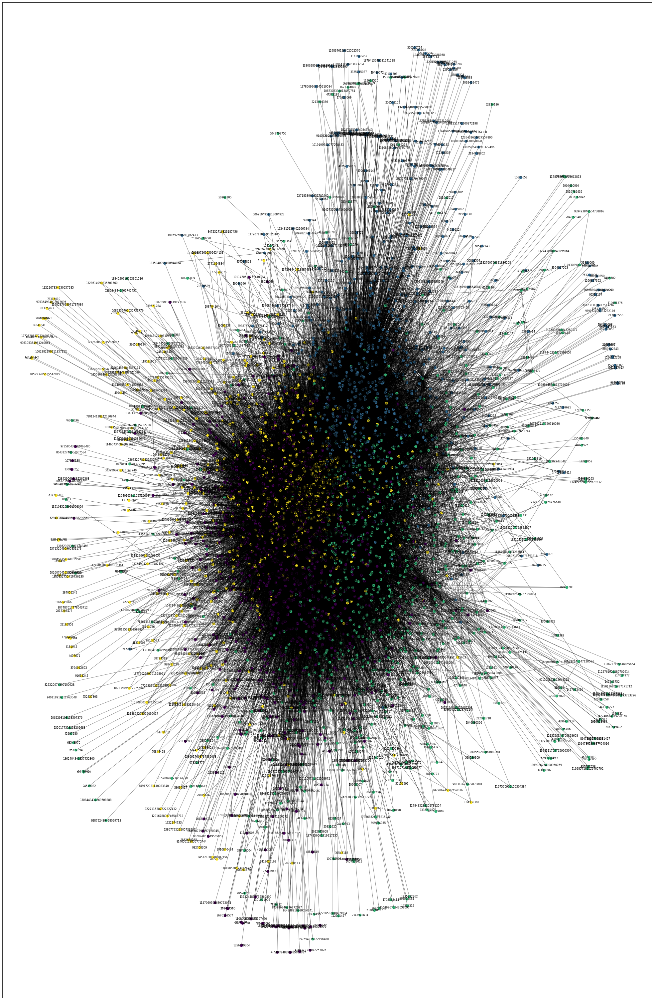

In [13]:
#first compute the best partition
partition = community_louvain.best_partition(G)

# draw the graph
pos = nx.spring_layout(G)
# color the nodes according to their partition
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
f, ax = plt.subplots(figsize=(35, 55))
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=60,
                       cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_labels(G, pos, font_size=8)
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.show()

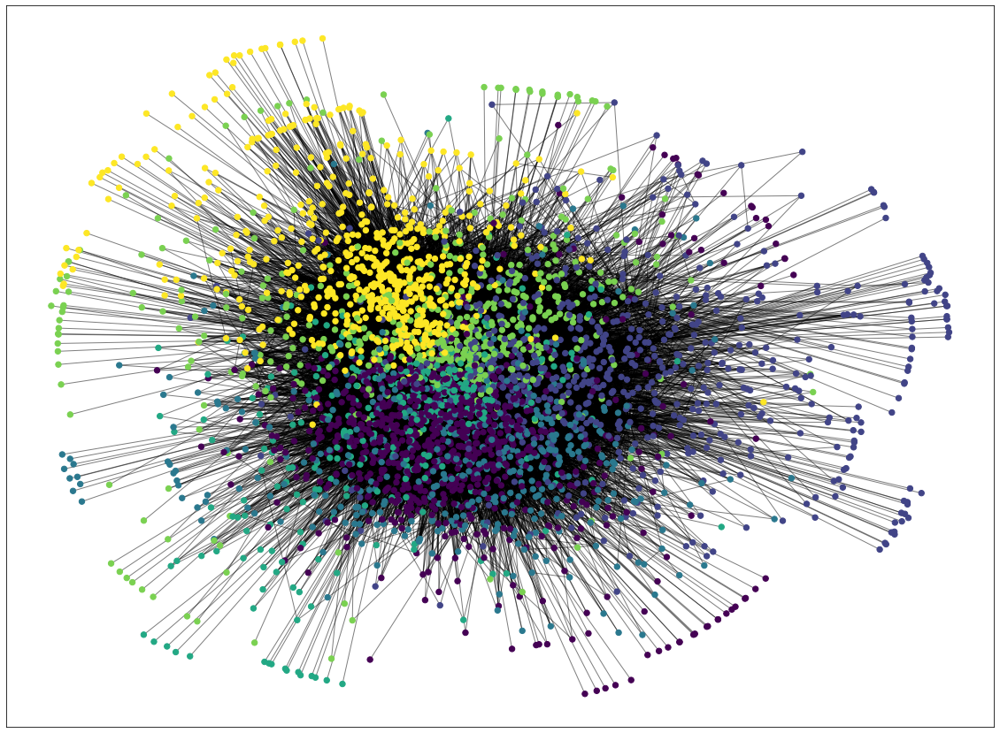

In [6]:
partition = community_louvain.best_partition(G)

# draw the graph
pos = nx.spring_layout(G)
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
f, ax = plt.subplots(figsize=(20, 15))
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40,
                       cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.show()

In [8]:
from networkx.algorithms.community import k_clique_communities
# Large graph --- difficult to compute
# c = list(k_clique_communities(G, 5))
# print(sorted(list(c[0])))
# print("-------------------------")
# c = list(k_clique_communities(G, 4))
# print(sorted(list(c[0])))
# print("-------------------------")
# c = list(k_clique_communities(G, 3))
# print(sorted(list(c[0])))

In [21]:
from networkx.algorithms.community import k_clique_communities
c = list(k_clique_communities(G, 12))
print(c)

[frozenset({920700510306529280, 1189744336415723520, 1101500498564313090, 1190461842922995712, 1195040516318093312, 1070321898951753728, 1089815501109452800, 427431943, 1099250750155354114, 1313137113454579717, 99015174, 496430086, 17839109, 3128829965, 139499786, 217377296, 2591662868, 66722583, 3304471, 47605273, 1339637532, 17076764, 502155809, 130671142, 13507112, 45389867, 127894322, 547871798, 3102522680, 16868154, 257544772, 65915718, 2876226376, 78969930, 36417099, 3946229836, 544737616, 119512412, 101045085, 3395161438, 15159648, 26240101, 25481069, 294599794, 91168371, 8220532, 947311503216066560, 70422392, 2354542969, 54163837, 2190533245, 40156543, 22960511, 1318834900590563328, 990463569291595776, 862356144748204032, 14190724, 25134469, 1019221160742014976, 406303880, 1305589294288039938, 147949965, 3916694415, 375007888, 2815077014, 1991321, 23761309, 3041372326, 108076200, 2998896042, 327122348, 778856886, 14451127, 96962998, 201194687, 305474242, 22994885, 20640711, 177

In [19]:
c = list(k_clique_communities(G, 13))
print(c)

[frozenset({920700510306529280, 1189744336415723520, 1190461842922995712, 1195040516318093312, 1318834900590563328, 25134469, 99015174, 427431943, 406303880, 496430086, 990463569291595776, 3128829965, 147949965, 3916694415, 217377296, 375007888, 2815077014, 3304471, 66722583, 1991321, 1339637532, 23761309, 130671142, 3041372326, 13507112, 108076200, 327122348, 127894322, 3102522680, 16868154, 201194687, 305474242, 257544772, 65915718, 2876226376, 78969930, 36417099, 3946229836, 17743823, 544737616, 15455450, 119512412, 101045085, 92071137, 78269677, 26711278, 114485232, 91168371, 59263220, 19677430, 229601276, 2190533245, 40156543})]


In [9]:
c = list(k_clique_communities(G, 14))
print(c)

[]


Find communities in graph using Clauset-Newman-Moore greedy modularity maximization.
This method currently supports the Graph class and does not consider edge weights.
Greedy modularity maximization begins with each node in its own community and joins the pair of communities that most increases modularity until no such pair exists.

In [14]:
import networkx.algorithms.community as nxcom
communities = sorted(nxcom.greedy_modularity_communities(G), key=len, reverse=True)
print("Number of communities: ",len(communities))

Number of communities:  10


In [27]:
import networkx.algorithms.community as nx_comm
comp = nx_comm.girvan_newman(G)
comp =tuple(sorted(c) for c in next(comp))
print("Modularity of communities:",nx_comm.modularity(G, comp))
# print(nx_comm.modularity(G, nx_comm.label_propagation_communities(G)))

Modularity of communities: 0.35714285714285704


#### If we try to observe without considering mapping between A and C set of users

In [5]:
import pandas as pd
df3 = pd.read_csv('Top100_A.csv',names=["source", "target"])
df4 = pd.read_csv('Top100_C.csv',names=["source", "target"])
df3['source'] = df3['source'].apply(lambda x: int(x))
df4['source'] = df4['source'].apply(lambda x: int(x))
df3['target'] = df3['target'].apply(lambda x: int(x))
df4['target'] = df4['target'].apply(lambda x: int(x))
frames = [df3, df4]
df = pd.concat(frames)
G = nx.from_pandas_edgelist(df, 'source', 'target')
print("Number of Nodes = ",G.number_of_nodes(),"Number of Edges = ",G.number_of_edges())

Number of Nodes =  3537 Number of Edges =  3971


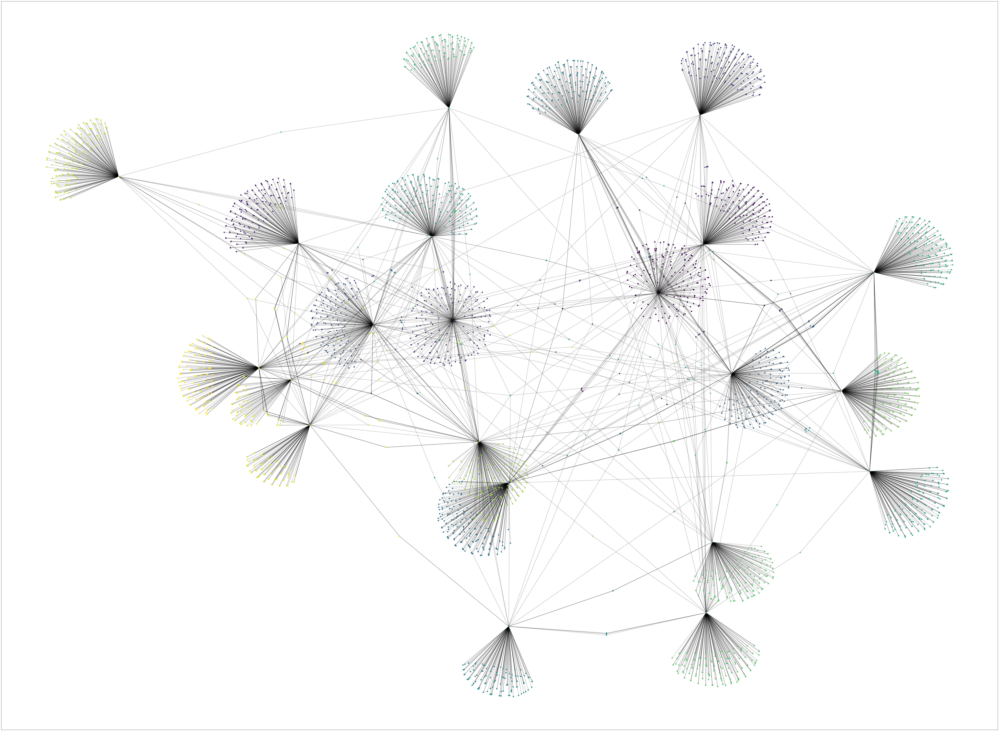

In [8]:
#first compute the best partition
partition = community_louvain.best_partition(G)

# # compute the best partition
# partition = community_louvain.best_partition(G)

# draw the graph
pos = nx.spring_layout(G)
# color the nodes according to their partition
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
f, ax = plt.subplots(figsize=(100, 75))
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40,
                       cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.show()

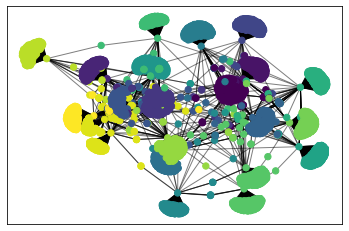

In [9]:
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
# f, ax = plt.subplots(figsize=(100, 75))
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40,
                       cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.show()

In [15]:
from networkx.algorithms.community import k_clique_communities

c = list(k_clique_communities(G, 4))
print(sorted(list(c)))
print("-------------------------")
c = list(k_clique_communities(G, 3))
for i in sorted(list(c)):
    print(i)
    print("-------------------------")

[frozenset({1190461842922995712, 1318834900590563328, 905153129582354432, 1189744336415723520, 2190533245})]
-------------------------
frozenset({1318241272306520067, 2785337469, 427431943})
-------------------------
frozenset({14968475, 2785337469, 3029428775})
-------------------------
frozenset({1332084915333107712, 14968475, 3107101390})
-------------------------
frozenset({2577596593, 2815077014, 85648537, 96135022})
-------------------------
frozenset({1189744336415723520, 1318834900590563328, 1352707790125469696, 1069553391892865024, 905153129582354432, 1190461842922995712, 1058709676181913603, 427431943, 123850117, 826177782560518148, 1382354067922558981, 14190724, 1240399836857409537, 1215400599057063937, 786935924579893248, 2751155215, 1408142352, 222625547, 139499786, 493164435, 791191245112483840, 869203933994024964, 983231118865346560, 1991321, 1278590208930283525, 1179002547438325765, 1339637532, 1210697023457878016, 953638180154150918, 2208839972, 1527461, 108076200, 571

https://orbifold.net/default/community-detection-using-networkx/

Referance for below graphs

In [ ]:
import networkx.algorithms.community as nxcom
communities = sorted(nxcom.greedy_modularity_communities(G), key=len, reverse=True)
print("Number of communities: ",len(communities))

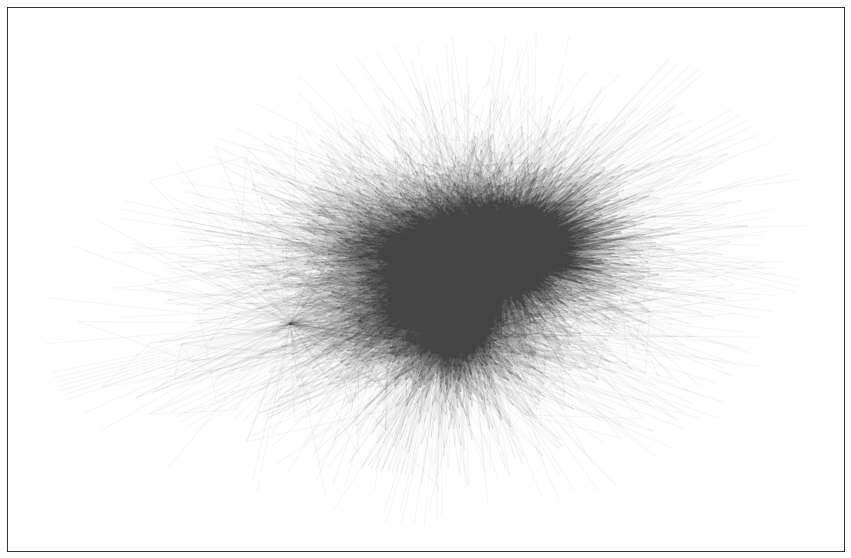

In [28]:
pos = nx.spring_layout(G, k=0.1)
plt.rcParams.update({'figure.figsize': (15, 10)})
nx.draw_networkx(G, pos=pos, node_size=0, edge_color="#444444", alpha=0.05, with_labels=False)

In [10]:
def set_node_community(G, communities):
        '''Add community to node attributes'''
        for c, v_c in enumerate(communities):
            for v in v_c:
                # Add 1 to save 0 for external edges
                G.nodes[v]['community'] = c + 1

def set_edge_community(G):
        '''Find internal edges and add their community to their attributes'''
        for v, w, in G.edges:
            if G.nodes[v]['community'] == G.nodes[w]['community']:
                # Internal edge, mark with community
                G.edges[v, w]['community'] = G.nodes[v]['community']
            else:
                # External edge, mark as 0
                G.edges[v, w]['community'] = 0

def get_color(i, r_off=1, g_off=1, b_off=1):
        '''Assign a color to a vertex.'''
        r0, g0, b0 = 0, 0, 0
        n = 16
        low, high = 0.1, 0.9
        span = high - low
        r = low + span * (((i + r_off) * 3) % n) / (n - 1)
        g = low + span * (((i + g_off) * 5) % n) / (n - 1)
        b = low + span * (((i + b_off) * 7) % n) / (n - 1)
        return (r, g, b)            

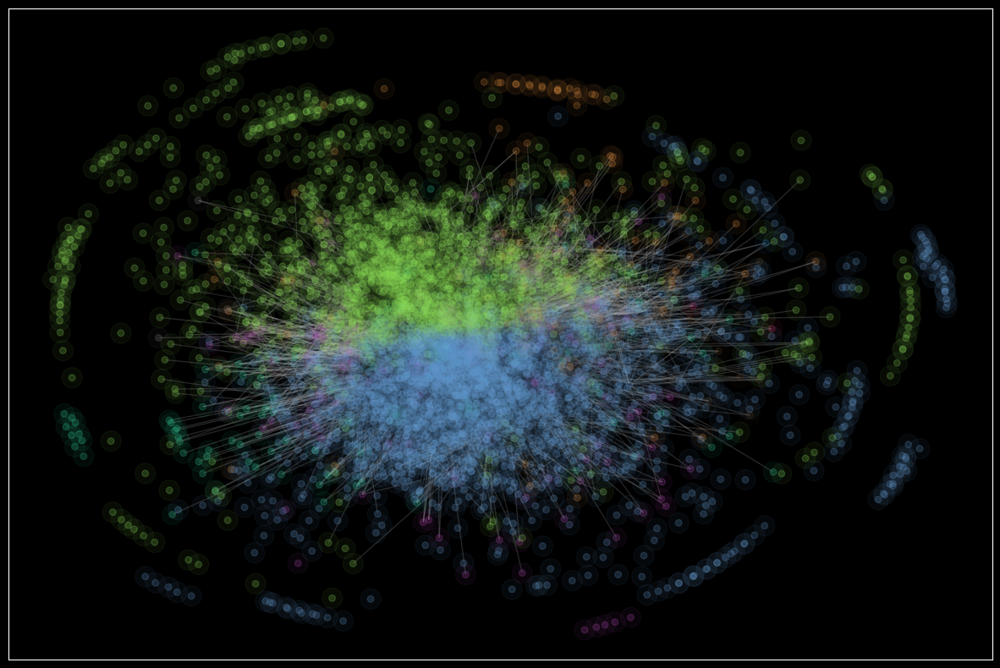

In [15]:
G_social=G
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams.update({'figure.figsize': (15, 10)})
plt.style.use('dark_background')

    # Set node and edge communities

set_node_community(G_social, communities)
set_edge_community(G_social)

    # Set community color for internal edges
external = [(v, w) for v, w in G_social.edges if G_social.edges[v, w]['community'] == 0]
internal = [(v, w) for v, w in G_social.edges if G_social.edges[v, w]['community'] > 0]
internal_color = ["black" for e in internal]
node_color = [get_color(G_social.nodes[v]['community']) for v in G_social.nodes]
# external edges
nx.draw_networkx(
        G_social, 
        pos=pos, 
        node_size=30, 
        edgelist=external, 
        edge_color="silver",
        node_color=node_color,
        alpha=0.2, 
        with_labels=False)
    # internal edges
nx.draw_networkx(
        G_social, pos=pos, 

        edgelist=internal, 
        edge_color=internal_color,
        node_color=node_color,
        alpha=0.05, 
        with_labels=False)